In [1]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from rasterio.warp import reproject, Resampling
from rasterio.plot import show
from skimage.draw import line
from rasterio import open as rio_open
from scipy.signal import savgol_filter
from PIL import Image
import pandas as pd

In [2]:
# Function to read the image using rasterio
def read_image(tif_path):
    #with rasterio.open(image_path) as dataset:
    with rasterio.open(tif_path) as src:
        image = src.read(1)
        transform = src.transform  # Get geotransform
        crs = src.crs  # Get coordinate reference system
        bounds = src.bounds  # Get bounding box
    return image, transform, crs, bounds


def extract_line_profile(tif_path, start_point_geo, end_point_geo, plot_line=True):
    """
    Extract the profile line from a TIFF file and optionally plot the line on the image.
    
    Parameters:
        tif_path (str): Path to the TIFF file.
        start_point_geo (tuple): Starting point in georeferenced coordinates (easting, northing).
        end_point_geo (tuple): Ending point in georeferenced coordinates (easting, northing).
        plot_line (bool): Whether to plot the line on the image. Default is True.
    
    Returns:
        numpy.ndarray: Pixel values along the profile line.
    """
    with rasterio.open(tif_path) as src:
        band = src.read(1)  # Read the first (or only) band
        transform = src.transform  # Get geotransform
        crs = src.crs  # Get coordinate reference system

    # Convert georeferenced coordinates to pixel coordinates
    start_point_pixel = ~transform * start_point_geo  # (col, row)
    end_point_pixel = ~transform * end_point_geo  # (col, row)
    """
    # Round to nearest integer for pixel indices
    #Rounding to the nearest integer is a critical step when converting 
    georeferenced coordinates to pixel indices. It ensures that:

    # The indices are valid integers.
    
    # The correct pixel is selected.
    
    # No IndexError is raised.
    """
    # Round to nearest integer for pixel indices
    start_point_pixel = (int(round(start_point_pixel[1])), int(round(start_point_pixel[0])))  # (row, col)
    end_point_pixel = (int(round(end_point_pixel[1])), int(round(end_point_pixel[0])))  # (row, col)

    # Get line indices
    rr, cc = line(start_point_pixel[0], start_point_pixel[1], end_point_pixel[0], end_point_pixel[1])

    # Extract pixel values along the line
    profile_values = band[rr, cc]
    return profile_values

# Function to normalize the image
def normalize(array):
    """
    Normalize an array to the range [0, 1].
    
    Parameters:
        array (numpy.ndarray): Input 2D array.
    
    Returns:
        numpy.ndarray: Normalized array.
    """
    array_min, array_max = array.min(), array.max()
    return (array - array_min) / (array_max - array_min)

# Function to extract profile line values from a raster
def extract_normlized_line_profile(tif_path, start_point_geo, end_point_geo):
    with rasterio.open(tif_path) as src:
        band = src.read(1)  # Read the first (or only) band
        band_norm = 1- normalize(band)
        transform = src.transform  # Get geotransform
        crs = src.crs  # Get coordinate reference system
    # Convert georeferenced coordinates to pixel coordinates
    start_point_pixel = ~transform * start_point_geo  # (col, row)
    end_point_pixel = ~transform * end_point_geo  # (col, row)

    # Round to nearest integer for pixel indices
    start_point_pixel = (int(round(start_point_pixel[1])), int(round(start_point_pixel[0])))  # (row, col)
    end_point_pixel = (int(round(end_point_pixel[1])), int(round(end_point_pixel[0])))  # (row, col)

    # Get line indices
    rr, cc = line(start_point_pixel[0], start_point_pixel[1], end_point_pixel[0], end_point_pixel[1])

    # Extract pixel values along the line
    profile_values = band_norm[rr, cc]
    return profile_values


def smooth_data(data, window_size=101, polyorder=2): 
    return savgol_filter(data, window_size, polyorder)


def process_tif_paths(tif_path, start_point, end_point):
    """
    Processes a list of TIF file paths to extract, invert, smooth,
    and return the line profile data.

    Args:
        tif_paths (list): List of file paths to TIF files.
        start_point (tuple): Starting point for line profile extraction.
        end_point (tuple): Ending point for line profile extraction.

    Returns:
        list: A list of smoothed and inverted line profile values.
    """
     # Extract line profile data
    values = extract_normlized_line_profile(tif_path, start_point, end_point)
    inverted_values = values  # Reverse convexity
    smoothed_values = smooth_data(inverted_values)  # Smooth the data
    return smoothed_values

C:\Users\Mohannad Zahra\AppData\Local\Temp\ipykernel_22256\3004317711.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.05, 0.98, 0.97])  # more padding for titles/colorbars


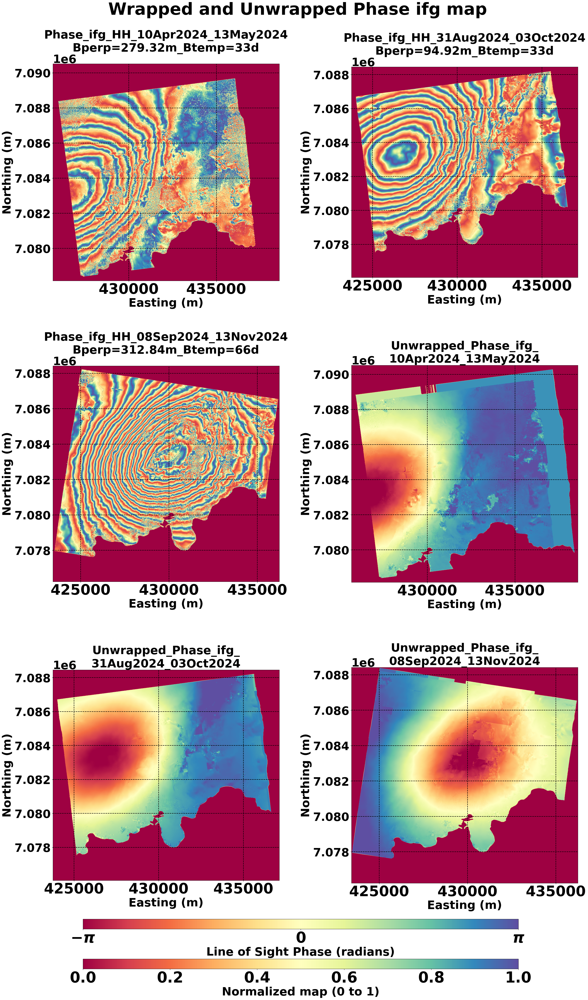

In [13]:
 # Read the images
# Paths to your TIFF files
tif_paths = [
    "Phase_ifg_HH_10Apr2024_13May2024_27N.tif",
    "Phase_ifg_HH_31Aug2024_03Oct2024_27N.tif",
    "Phase_ifg_HH_08Sep2024_13Nov2024_27N.tif",
    "Normalized_Unw_Phase_ifg_10Apr2024_13May2024_27N.tif",
    "Normalized_Unw_Phase_ifg_31Aug2024_03Oct2024_27N.tif",
    "Normalized_Unw_Phase_ifg_08Sep2024_13Nov2024_27N.tif",
    "Normalized_Unw_Phase_ifg_10Apr2024_13May2024_27N.tif",
    "Normalized_Unw_Phase_ifg_31Aug2024_03Oct2024_27N.tif",
    "Normalized_Unw_Phase_ifg_08Sep2024_13Nov2024_27N.tif"
]

titles = [
    "Phase_ifg_HH_10Apr2024_13May2024\nBperp=279.32m_Btemp=33d",
    "Phase_ifg_HH_31Aug2024_03Oct2024\nBperp=94.92m_Btemp=33d",
    "Phase_ifg_HH_08Sep2024_13Nov2024\nBperp=312.84m_Btemp=66d",
    "Unwrapped_Phase_ifg_\n10Apr2024_13May2024",
    "Unwrapped_Phase_ifg_\n31Aug2024_03Oct2024",
    "Unwrapped_Phase_ifg_\n08Sep2024_13Nov2024",
    "Normalized_Unwrapped_Phase\n_ifg_10Apr2024_13May2024",
    "Normalized_Unwrapped_Phase\n_ifg_31Aug2024_03Oct2024",
    "Normalized_Unwrapped_Phase\n_ifg_08Sep2024_13Nov2024"
    
]

# Read the images
images = [read_image(path) for path in tif_paths]

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(30, 48))  # Adjust figsize as needed
axes = axes.flatten()

# Plot each image with georeferencing
for i, (ax, (image, transform, crs, bounds)) in enumerate(zip(axes, images)):
    # Plot the image with georeferencing
    #show(image, transform=transform, ax=ax, cmap="Spectral")
    
    # Check if the title corresponds to a coherence map
    if "Coherence map" in titles[i]:
        show(image, transform=transform, ax=ax, cmap="gray")  # Use grayscale for coherence
    else:
        show(image, transform=transform, ax=ax, cmap="Spectral")  # Use Spectral for others

    ax.set_title(titles[i])

    # Set axis labels based on CRS
    if crs.is_geographic:
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    else:
        ax.set_xlabel("Easting (m)",fontweight='bold')
        ax.set_ylabel("Northing (m)",fontweight='bold')

    # Add gridlines
    ax.grid(color='black', linestyle='--', linewidth=1.5)

# # Add a global colorbar for all images
#cbar_ax1 = fig.add_axes([0.90, 0.15, 0.02, 0.7])  # Position for the first colorbar
cbar_ax1 = fig.add_axes([0.15, 0.05, 0.7, 0.01])  # [left, bottom, width, height]
global_cbar1 = fig.colorbar(plt.cm.ScalarMappable(cmap="Spectral", norm=plt.Normalize(vmin=-np.pi, vmax=np.pi)), cax=cbar_ax1, orientation='horizontal')
# Define the ticks and tick labels
ticks = [-np.pi, 0, np.pi]  # Only three ticks: -π, 0, π
tick_labels = [r'$-\pi$', r'$0$', r'$\pi$']  # Corresponding labels

# Set the ticks and tick labels for the colorbar
global_cbar1.set_ticks(ticks)
global_cbar1.set_ticklabels(tick_labels)
global_cbar1.set_label("Line of Sight Phase (radians)",fontweight='bold')
global_cbar1.ax.tick_params(labelsize=52)  # Tick label font size

# # Add a second colorbar for normalized data (0 to 1)
#cbar_ax2 = fig.add_axes([0.945, 0.15, 0.02, 0.7])  # Position for the second colorbar
cbar_ax2 = fig.add_axes([0.15, 0.01, 0.7, 0.01])
global_cbar2 = fig.colorbar(plt.cm.ScalarMappable(cmap="Spectral", norm=plt.Normalize(0, 1)), cax=cbar_ax2, orientation='horizontal')
global_cbar2.set_label("Normalized map (0 to 1)",fontweight='bold')
global_cbar2.ax.tick_params(labelsize=52)  # Tick label font size


plt.tight_layout(rect=[0, 0.05, 0.98, 0.97])  # more padding for titles/colorbars


# Add a main title
fig.suptitle("Wrapped and Unwrapped Phase ifg map ",fontweight='bold')#,fontsize=46)#, fontsize=40, fontweight='bold')

# Set global font parameters
# plt.rcParams.update({
#     'font.size': 20,               # Set base font size
#     'axes.titlesize': 22,          # Title size of subplots
#     'axes.labelsize': 20,          # Axis labels
#     'xtick.labelsize': 18,         # x tick labels
#     'ytick.labelsize': 18,         # y tick labels
#     'legend.fontsize': 18,
#     'figure.titlesize': 42         # Main title size
# })

plt.rcParams.update({
    'font.size': 40,               # Base font size for all text
    'font.weight': 'bold',         # Global bold font
    'axes.titlesize': 40,          # Subplot titles
    'axes.labelsize': 40,          # Axis labels
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'xtick.labelsize': 50,         # Tick labels
    'ytick.labelsize': 40,
    'legend.fontsize': 46,
    'figure.titlesize': 58         # Main figure title
})

# Save the figure
fig.savefig("Wrapped and Unwrapped Phase ifg map.png", dpi=300, bbox_inches="tight")

plt.show()

C:\Users\Mohannad Zahra\AppData\Local\Temp\ipykernel_6044\1734229480.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.02, 0.98, 0.97])  # more padding for titles/colorbars


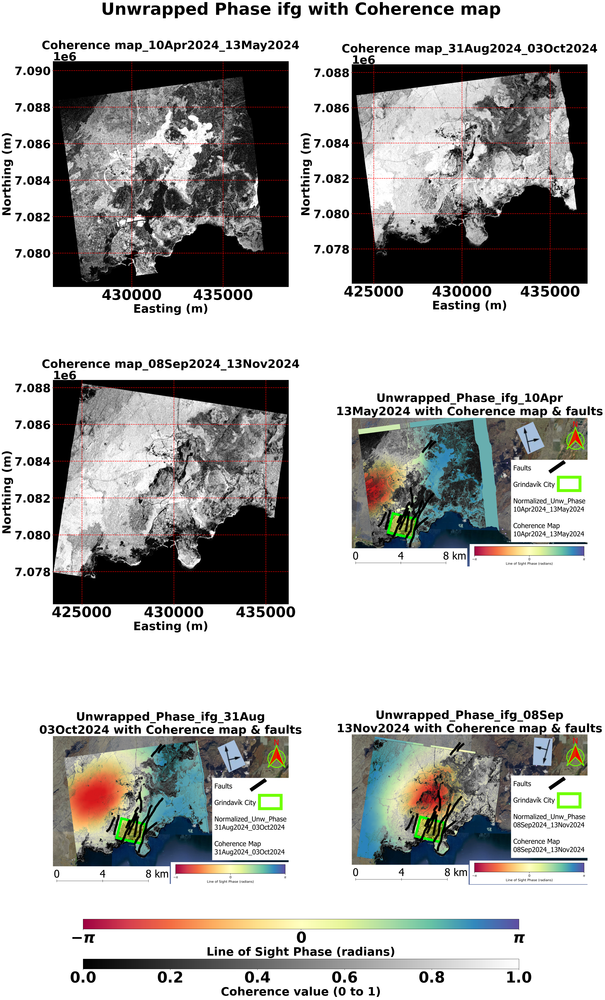

In [6]:
# # Read the images
# Paths to your TIFF files
tif_paths = [
    "coh_HH_10Apr2024_13May2024_27N.tif",
    "coh_HH_31Aug2024_03Oct2024_27N.tif",
    "coh_HH_08Sep2024_13Nov2024_27N.tif"
]

titles = [
    "Coherence map_10Apr2024_13May2024",
    "Coherence map_31Aug2024_03Oct2024",
    "Coherence map_08Sep2024_13Nov2024"
    
]

# Read the images
images = [read_image(path) for path in tif_paths]

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(30, 48))  # Adjust figsize as needed
axes = axes.flatten()

# Plot each image with georeferencing
for i, (ax, (image, transform, crs, bounds)) in enumerate(zip(axes, images)):
    # Plot the image with georeferencing
    #show(image, transform=transform, ax=ax, cmap="Spectral")
    
    # Check if the title corresponds to a coherence map
    if "Coherence map" in titles[i]:
        show(image, transform=transform, ax=ax, cmap="gray")  # Use grayscale for coherence
    else:
        show(image, transform=transform, ax=ax, cmap="Spectral")  # Use Spectral for others

    ax.set_title(titles[i])

    # Set axis labels based on CRS
    if crs.is_geographic:
        ax.set_xlabel("Longitude")
        ax.set_ylabel("Latitude")
    else:
        ax.set_xlabel("Easting (m)",fontweight='bold')
        ax.set_ylabel("Northing (m)",fontweight='bold')

    # Add gridlines
    ax.grid(color='red', linestyle='--', linewidth=1.5)


# # Add a second colorbar for normalized data (0 to 1)
#cbar_ax3 = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the second colorbar
cbar_ax1 = fig.add_axes([0.15, 0.05, 0.7, 0.01])  # [left, bottom, width, height]
global_cbar1 = fig.colorbar(plt.cm.ScalarMappable(cmap="Spectral", norm=plt.Normalize(vmin=-np.pi, vmax=np.pi)), cax=cbar_ax1, orientation='horizontal')
# Define the ticks and tick labels
ticks = [-np.pi, 0, np.pi]  # Only three ticks: -π, 0, π
tick_labels = [r'$-\pi$', r'$0$', r'$\pi$']  # Corresponding labels

# Set the ticks and tick labels for the colorbar
global_cbar1.set_ticks(ticks)
global_cbar1.set_ticklabels(tick_labels)
global_cbar1.set_label("Line of Sight Phase (radians)",fontweight='bold')
global_cbar1.ax.tick_params(labelsize=52)  # Tick label font size

#cbar_ax3 = fig.add_axes([0.15, 0.05, 0.7, 0.007])  # [left, bottom, width, height]
cbar_ax3 = fig.add_axes([0.15, 0.01, 0.7, 0.01])
global_cbar3 = fig.colorbar(plt.cm.ScalarMappable(cmap="gray", norm=plt.Normalize(0, 1)), cax=cbar_ax3, orientation='horizontal')
global_cbar3.set_label("Coherence value (0 to 1)")
global_cbar3.ax.tick_params(labelsize=52)  # Tick label font size


image1 = Image.open("Unw+fault_10_13.png")

plt.subplot(3, 2, 4)
plt.imshow(image1)  # Keep original colors for the maps
plt.title("Unwrapped_Phase_ifg_10Apr\n13May2024 with Coherence map & faults")
plt.axis('off')  # Turn off axis


image2 = Image.open("Unw+fault_31_03.png")

plt.subplot(3, 2, 5)
plt.imshow(image2)  # Keep original colors for the maps
plt.title("Unwrapped_Phase_ifg_31Aug\n03Oct2024 with Coherence map & faults")
plt.axis('off')  # Turn off axis

image3= Image.open("Unw+fault_08_13.png")

plt.subplot(3, 2, 6)
plt.imshow(image3)  # Keep original colors for the maps
plt.title("Unwrapped_Phase_ifg_08Sep\n13Nov2024 with Coherence map & faults")#, fontsize=12, fontweight='bold')
plt.axis('off')  # Turn off axis

# Adjust layout
#plt.tight_layout(rect=[0, 0, 0.9, 0.95])
#plt.tight_layout(rect=[0.05, 0.1, 1, 0.92])  # Leave space at bottom
plt.tight_layout(rect=[0, 0.02, 0.98, 0.97])  # more padding for titles/colorbars


# Add a main title
fig.suptitle(" Unwrapped Phase ifg with Coherence map ",fontweight='bold')#,fontsize=46)#, fontsize=40, fontweight='bold')

# Set global font parameters
# plt.rcParams.update({
#     'font.size': 20,               # Set base font size
#     'axes.titlesize': 22,          # Title size of subplots
#     'axes.labelsize': 20,          # Axis labels
#     'xtick.labelsize': 18,         # x tick labels
#     'ytick.labelsize': 18,         # y tick labels
#     'legend.fontsize': 18,
#     'figure.titlesize': 42         # Main title size
# })

plt.rcParams.update({
    'font.size': 40,               # Base font size for all text
    'font.weight': 'bold',         # Global bold font
    'axes.titlesize': 40,          # Subplot titles
    'axes.labelsize': 40,          # Axis labels
    'axes.titleweight': 'bold',
    'axes.labelweight': 'bold',
    'xtick.labelsize': 50,         # Tick labels
    'ytick.labelsize': 40,
    'legend.fontsize': 40,
    'figure.titlesize': 58         # Main figure title
})

# Save the figure
fig.savefig("Unwrapped Phase ifg with Coherence map12.png", dpi=300, bbox_inches="tight")

plt.show()